In [211]:
import ete3
import subprocess
import os
import random
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
import colorlover as cl

%cd /work/site_rate/hug_et_al/best_phylogenies/ufboots/

/work/site_rate/hug_et_al/best_phylogenies/ufboots


In [31]:
tmp = ete3.Tree('/work/site_rate/hug_et_al/ribosomal_concat.fasta.treefile',
                 format=1)
bacteria     = []
archaea      = []
eukarya      = []
for leaf in tmp.get_leaf_names():
    if leaf.startswith('Bacteria'):
        bacteria.append(leaf)
    elif leaf.startswith('Archaea'):
        archaea.append(leaf)
    elif leaf.startswith('Eukaryota'):
        eukarya.append(leaf)

In [15]:
models = dict(
    lg   = ['whole_alignment_FU.ufboot',
                  'no_fast_evolving_sites.aln.ufboot',
                  'no_slow_evolving_sites.aln.ufboot', 
                  'just_mid_evolving_sites.aln.ufboot'],
    c60  = ['C60_ribosomal_concat.fasta.ufboot',
                  'C60_no_fast_evolving_sites.aln.ufboot',
                  'C60_no_slow_evolving_sites.aln.ufboot',
                  'C60_just_mid_evolving_sites.aln.ufboot'],
    lg4x = ['LG4X_ribosomal_concat.fasta.ufboot',
                  'LG4X_no_fast_evolving_sites.aln.ufboot',
                  'LG4X_no_slow_evolving_sites.aln.ufboot',
                  'LG4X_just_mid_evolving_sites.aln.ufboot']
)
model_data = pd.DataFrame(models, index='whole_aln no_fast no_slow no_extremes'.split()).T
model_data

,whole_aln,no_fast,no_slow,no_extremes
lg,whole_alignment_FU.ufboot,no_fast_evolving_sites.aln.ufboot,no_slow_evolving_sites.aln.ufboot,just_mid_evolving_sites.aln.ufboot
c60,C60_ribosomal_concat.fasta.ufboot,C60_no_fast_evolving_sites.aln.ufboot,C60_no_slow_evolving_sites.aln.ufboot,C60_just_mid_evolving_sites.aln.ufboot
lg4x,LG4X_ribosomal_concat.fasta.ufboot,LG4X_no_fast_evolving_sites.aln.ufboot,LG4X_no_slow_evolving_sites.aln.ufboot,LG4X_just_mid_evolving_sites.aln.ufboot


In [205]:
out = open('sampled_topologies', 'w')

random.seed(12345)
random_lines   = random.sample(range(1000), 100)
traverse_order = []
for index, row in model_data.iterrows():
    for column, filename in row.items():
        ufboot = open(filename).readlines()
        for line_number in random_lines:
            tree = ete3.Tree(ufboot[line_number])
            
            tree.set_outgroup(eukarya[0])
            bacteria_ancestor = tree.get_common_ancestor(bacteria)
            tree.set_outgroup(bacteria_ancestor)
            tree = tree.get_common_ancestor(archaea+eukarya)
            
            out.write('%s\n' % tree.write(format=9))
            traverse_order.append('%s-%s-%i' % (column, index, line_number))
out.close()

In [206]:
subprocess.call(['iqtree', '-t', 'sampled_topologies', '-rf_all', '-nt', '15'])

0

In [207]:
distances = []
for line in open('sampled_topologies.rfdist').readlines()[1:]:
    line = line.split()[1:]
    distances.append([float(value) for value in line])

df = pd.DataFrame(index=traverse_order,
                  columns=traverse_order,
                  data=distances)

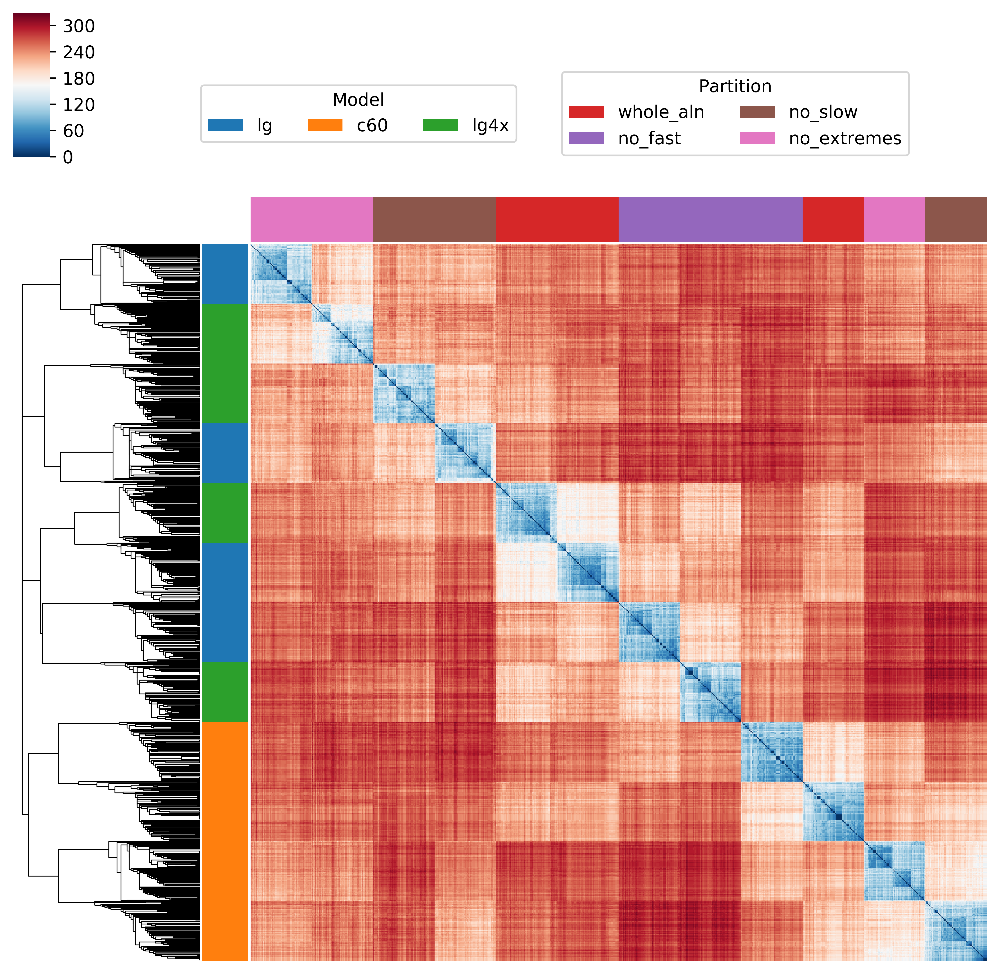

In [291]:
#https://stackoverflow.com/questions/27988846/how-to-express-classes-on-the-axis-of-a-heatmap-in-seaborn
tree_linkage    = linkage(squareform(df.values), method='single')
tree_dendrogram = dendrogram(tree_linkage, no_plot=True)
sorted_labels   = [traverse_order[num] for num in tree_dendrogram['leaves']]

model_colors     = dict(zip(model_data.index,   sns.color_palette(n_colors=7).as_hex()[:3]))
partition_colors = dict(zip(model_data.columns, sns.color_palette(n_colors=7).as_hex()[3:]))

row_colors    = [model_colors[    element.split('-')[1]] for element in traverse_order]
column_colors = [partition_colors[element.split('-')[0]] for element in sorted_labels]

heatmap = sns.clustermap(df.reindex(columns=sorted_labels), 
                         col_cluster=False, row_linkage=tree_linkage,
                         cmap='RdBu_r', row_colors=row_colors, col_colors=column_colors,
                         xticklabels=False, yticklabels=False,)

for label in model_data.index:
    heatmap.ax_col_dendrogram.bar(0, 0, color=model_colors[label], label=label, linewidth=0)
l1 = heatmap.ax_col_dendrogram.legend(title='Model', 
                                      loc="center",
                                      ncol=5,
                                      bbox_to_anchor=(0.4, 0.8),
                                      bbox_transform=plt.gcf().transFigure)
for label in model_data.columns:
    heatmap.ax_row_dendrogram.bar(0, 0, color=partition_colors[label], label=label, linewidth=0)
l2 = heatmap.ax_row_dendrogram.legend(title='Partition', 
                                      loc="center",
                                      ncol=2,
                                      bbox_to_anchor=(0.7, 0.8),
                                      bbox_transform=plt.gcf().transFigure)


heatmap.fig.set_dpi(600)
heatmap.fig.savefig('/Users/thiberio/Desktop/heatmap_test2.png')

In [332]:
tmp = df.copy()
tmp['name']      = tmp.index
tmp['model']     = [index.split('-')[1] for index in tmp.index]
tmp['partition'] = [index.split('-')[0] for index in tmp.index]
tmp.set_index(['name', 'model', 'partition'], inplace=True)
tmp.columns = tmp.index
tmp.columns.set_levels(['Trimmed slow and fast', 'Trimmed fast', 'Trimmed slow', 'Whole alingnment'],
                       level=2, inplace=True)
tmp.index.set_levels(['Trimmed slow and fast', 'Trimmed fast', 'Trimmed slow', 'Whole alingnment'],
                       level=2, inplace=True)

tmp.columns.set_levels(['C60', 'LG+G', 'LG4X'],
                       level=1, inplace=True)
tmp.index.set_levels(['C60', 'LG+G', 'LG4X'],
                       level=1, inplace=True)

tmp.head()

,,name,whole_aln-lg-426,whole_aln-lg-750,whole_aln-lg-10,whole_aln-lg-839,whole_aln-lg-845,whole_aln-lg-822,whole_aln-lg-305,whole_aln-lg-875,whole_aln-lg-377,whole_aln-lg-954,...,no_extremes-lg4x-263,no_extremes-lg4x-602,no_extremes-lg4x-444,no_extremes-lg4x-530,no_extremes-lg4x-132,no_extremes-lg4x-42,no_extremes-lg4x-168,no_extremes-lg4x-308,no_extremes-lg4x-885,no_extremes-lg4x-852
,,model,LG+G,LG+G,LG+G,LG+G,LG+G,LG+G,LG+G,LG+G,LG+G,LG+G,...,LG4X,LG4X,LG4X,LG4X,LG4X,LG4X,LG4X,LG4X,LG4X,LG4X
,,partition,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,Whole alingnment,...,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast,Trimmed slow and fast
name,model,partition,,,,,,,,,,,,,,,,,,,,,
whole_aln-lg-426,LG+G,Whole alingnment,0.0,108.0,94.0,72.0,80.0,148.0,124.0,88.0,84.0,78.0,...,270.0,272.0,280.0,276.0,240.0,260.0,252.0,260.0,274.0,262.0
whole_aln-lg-750,LG+G,Whole alingnment,108.0,0.0,134.0,104.0,130.0,156.0,162.0,74.0,124.0,76.0,...,262.0,274.0,278.0,274.0,242.0,248.0,250.0,262.0,260.0,248.0
whole_aln-lg-10,LG+G,Whole alingnment,94.0,134.0,0.0,92.0,80.0,144.0,124.0,108.0,70.0,108.0,...,270.0,266.0,256.0,262.0,240.0,258.0,252.0,266.0,256.0,264.0
whole_aln-lg-839,LG+G,Whole alingnment,72.0,104.0,92.0,0.0,58.0,134.0,108.0,94.0,66.0,96.0,...,250.0,258.0,258.0,270.0,232.0,246.0,230.0,248.0,252.0,242.0
whole_aln-lg-845,LG+G,Whole alingnment,80.0,130.0,80.0,58.0,0.0,146.0,118.0,106.0,66.0,104.0,...,270.0,276.0,262.0,280.0,242.0,256.0,248.0,264.0,260.0,264.0


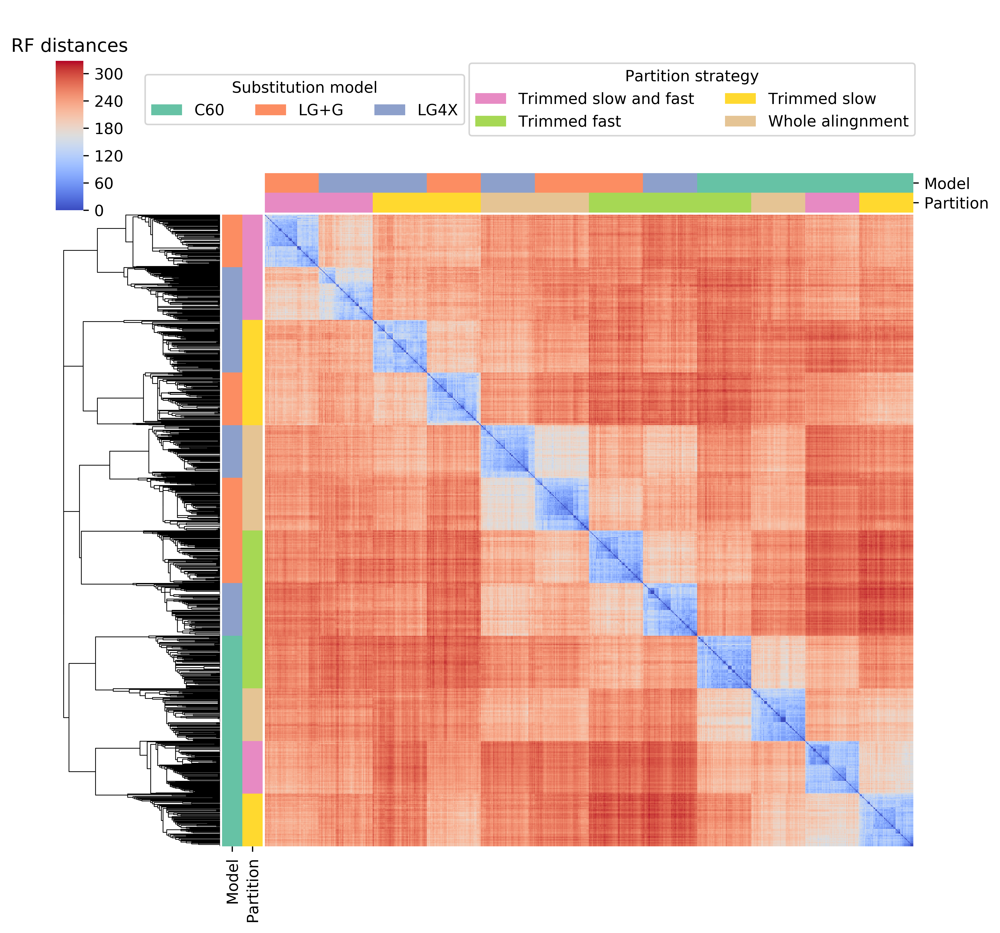

In [333]:
#https://stackoverflow.com/questions/27988846/how-to-express-classes-on-the-axis-of-a-heatmap-in-seaborn
tree_linkage    = linkage(squareform(tmp.values), method='single')
tree_dendrogram = dendrogram(tree_linkage, no_plot=True)
sorted_labels   = [tmp.index[num] for num in tree_dendrogram['leaves']]
tmp = tmp.reindex(columns=sorted_labels)

colors = ['#%02x%02x%02x' % tuple([int(element) for element in color ])
          for color in cl.to_numeric(cl.scales['7']['qual']['Set2'])]
model_colors     = dict(zip(tmp.columns.levels[1],   colors[:3]))
partition_colors = dict(zip(tmp.columns.levels[2], colors[3:]))

row_colors    = pd.Series([model_colors[    element[1]] for element in sorted_labels],
                          index=tmp.columns,
                          name='Model')
column_colors = pd.Series([partition_colors[element[2]] for element in sorted_labels],
                          index=tmp.columns,
                          name='Partition')

combined_colors = pd.DataFrame(row_colors).join(pd.DataFrame(column_colors))
#tmp = tmp.reindex(columns=sorted_labels, index=sorted_labels)
heatmap = sns.clustermap(tmp.reindex(columns=sorted_labels), 
                         col_cluster=False, row_linkage=tree_linkage,
                         cmap='coolwarm', row_colors=combined_colors, col_colors=combined_colors,
                         xticklabels=False, yticklabels=False)

for label in tmp.columns.levels[1]:
    heatmap.ax_col_dendrogram.bar(0, 0, color=model_colors[label], label=label, linewidth=0)
l1 = heatmap.ax_col_dendrogram.legend(title='Substitution model', 
                                      loc="center",
                                      ncol=5,
                                      bbox_to_anchor=(0.35, 0.8),
                                      bbox_transform=plt.gcf().transFigure)
for label in tmp.columns.levels[2]:
    heatmap.ax_row_dendrogram.bar(0, 0, color=partition_colors[label], label=label, linewidth=0)
l2 = heatmap.ax_row_dendrogram.legend(title='Partition strategy', 
                                      loc="center",
                                      ncol=2,
                                      bbox_to_anchor=(0.7, 0.8),
                                      bbox_transform=plt.gcf().transFigure)

heatmap.ax_heatmap.set_xlabel('')
heatmap.ax_heatmap.set_ylabel('')
heatmap.cax.set_position([.125, .7, .025, .135])
#heatmap.cax.set_position([.16, .2, .03, .45])
heatmap.cax.set_title('RF distances')
heatmap.fig.set_dpi(600)
heatmap.fig.savefig('/Users/thiberio/Desktop/heatmap_test.png')

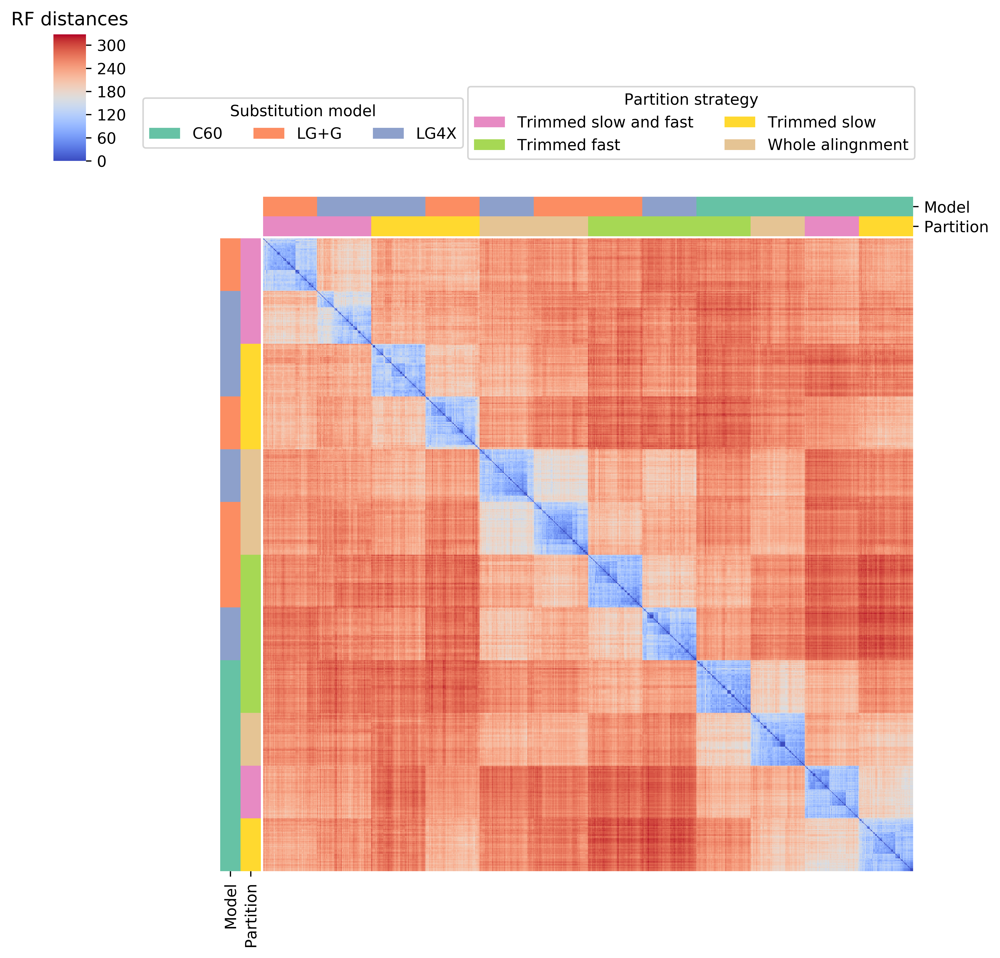

In [304]:
#https://stackoverflow.com/questions/27988846/how-to-express-classes-on-the-axis-of-a-heatmap-in-seaborn
tree_linkage    = linkage(squareform(tmp.values), method='single')
tree_dendrogram = dendrogram(tree_linkage, no_plot=True)
sorted_labels   = [tmp.index[num] for num in tree_dendrogram['leaves']]
tmp = tmp.reindex(columns=sorted_labels)

colors = ['#%02x%02x%02x' % tuple([int(element) for element in color ])
          for color in cl.to_numeric(cl.scales['7']['qual']['Set2'])]
model_colors     = dict(zip(tmp.columns.levels[1],   colors[:3]))
partition_colors = dict(zip(tmp.columns.levels[2], colors[3:]))

row_colors    = pd.Series([model_colors[    element[1]] for element in sorted_labels],
                          index=tmp.columns,
                          name='Model')
column_colors = pd.Series([partition_colors[element[2]] for element in sorted_labels],
                          index=tmp.columns,
                          name='Partition')

combined_colors = pd.DataFrame(row_colors).join(pd.DataFrame(column_colors))
tmp = tmp.reindex(columns=sorted_labels, index=sorted_labels)
heatmap = sns.clustermap(tmp, 
                         col_cluster=False, row_cluster=False,
                         cmap='coolwarm', row_colors=combined_colors, col_colors=combined_colors,
                         xticklabels=False, yticklabels=False)

for label in tmp.columns.levels[1]:
    heatmap.ax_col_dendrogram.bar(0, 0, color=model_colors[label], label=label, linewidth=0)
l1 = heatmap.ax_col_dendrogram.legend(title='Substitution model', 
                                      loc="center",
                                      ncol=5,
                                      bbox_to_anchor=(0.35, 0.8),
                                      bbox_transform=plt.gcf().transFigure)
for label in tmp.columns.levels[2]:
    heatmap.ax_row_dendrogram.bar(0, 0, color=partition_colors[label], label=label, linewidth=0)
l2 = heatmap.ax_row_dendrogram.legend(title='Partition strategy', 
                                      loc="center",
                                      ncol=2,
                                      bbox_to_anchor=(0.7, 0.8),
                                      bbox_transform=plt.gcf().transFigure)

heatmap.ax_heatmap.set_xlabel('')
heatmap.ax_heatmap.set_ylabel('')
#heatmap.cax.set_position([.16, .2, .03, .45])
heatmap.cax.set_title('RF distances')
heatmap.fig.set_dpi(600)
heatmap.fig.savefig('/Users/thiberio/Desktop/heatmap_test.png')

In [305]:
combined_colors

,,,Model,Partition
name,model,partition,,
no_extremes-lg-891,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-626,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-511,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-954,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-469,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-852,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-443,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-108,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
no_extremes-lg-444,LG+G,Trimmed slow and fast,#fc8d62,#e78ac3
